### Importing Necessary Libraries

In [5]:
!pip install wordcloud==1.9.3
!pip install nltk
!pip install PyPDF2
!pip install emoji
!pip install gensim
!pip install autocorrect

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string 
import re
import nltk
nltk.download(['stopwords','wordnet', 'punkt'])
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
import warnings 
warnings.filterwarnings('ignore')
import subprocess
from sklearn.feature_extraction.text import CountVectorizer
from PyPDF2 import PdfReader
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from collections import Counter
import emoji
import plotly.express as px
from spacy import displacy
from nltk.corpus import stopwords

import gensim
from gensim import corpora

import plotly.express as px
import ipywidgets as widgets
from IPython.display import display

BOLD = '\033[1m'
RESET = '\033[0m'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [7]:
# for other theme, please run: mpl.pyplot.style.available
PLOT_PALETTE = 'tableau-colorblind10'
# for other color map, please run: mpl.pyplot.colormaps()
WORDCLOUD_COLOR_MAP = 'tab10_r'

# set palette color
plt.style.use(PLOT_PALETTE)
%matplotlib inline

### Loading Data

Data Set Link - 

In [8]:
df = pd.read_csv('Resumes.csv')

### Basic EDA

In [9]:
print(df.head())
print()
print(BOLD + "Information about the data frame:" + RESET)
print()
df.info()

         ID                                         Resume_str  \
0  16852973           HR ADMINISTRATOR/MARKETING ASSOCIATE\...   
1  22323967           HR SPECIALIST, US HR OPERATIONS      ...   
2  33176873           HR DIRECTOR       Summary      Over 2...   
3  27018550           HR SPECIALIST       Summary    Dedica...   
4  17812897           HR MANAGER         Skill Highlights  ...   

                                         Resume_html Category  
0  <div class="fontsize fontface vmargins hmargin...       HR  
1  <div class="fontsize fontface vmargins hmargin...       HR  
2  <div class="fontsize fontface vmargins hmargin...       HR  
3  <div class="fontsize fontface vmargins hmargin...       HR  
4  <div class="fontsize fontface vmargins hmargin...       HR  

Information about the data frame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  --

##### Dropped Unused columns like ID, Resume_html

In [10]:
# drop unused columns
df.pop('ID')
df.pop('Resume_html')
df

,Resume_str,Category
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,HR
1,"HR SPECIALIST, US HR OPERATIONS ...",HR
2,HR DIRECTOR Summary Over 2...,HR
3,HR SPECIALIST Summary Dedica...,HR
4,HR MANAGER Skill Highlights ...,HR
...,...,...
2479,RANK: SGT/E-5 NON- COMMISSIONED OFFIC...,AVIATION
2480,"GOVERNMENT RELATIONS, COMMUNICATIONS ...",AVIATION
2481,GEEK SQUAD AGENT Professional...,AVIATION
2482,PROGRAM DIRECTOR / OFFICE MANAGER ...,AVIATION


##### Before Cleaning the resume

In [11]:
df["Resume_str"][1]

"         HR SPECIALIST, US HR OPERATIONS       Summary     Versatile  media professional with background in Communications, Marketing, Human Resources and Technology.\xa0        Experience     09/2015   to   Current     HR Specialist, US HR Operations    Company Name   －   City  ,   State       Managed communication regarding launch of Operations group, policy changes and system outages      Designed standard work and job aids to create comprehensive training program for new employees and contractors         Audited job postings for old, pending, on-hold and draft positions.           Audited union hourly, non-union hourly and salary background checks and drug screens             Conducted monthly new hire benefits briefing to new employees across all business units               Served as a link between HR Managers and vendors by handling questions and resolving system-related issues         Provide real-time process improvement feedback on key metrics and initiatives  Successfully r

#### Cleaning Resume Text

In [12]:
stemmer = nltk.stem.porter.PorterStemmer()

In [13]:
def preprocess(text):
    # Convert text to lowercase
    text = text.lower()
    
    # Remove non-english characters, punctuation, and numbers
    text = re.sub('[^a-zA-Z]', ' ', text)
    
    # Tokenize words
    words = word_tokenize(text)
    
    # Remove stop words and apply stemming
    words = [stemmer.stem(word) for word in words if word not in stopwords.words('english')]
    
    # Additional cleaning steps
    text = ' '.join(words)
    
     # Remove punctuations, mentions, hashtags, RT and cc,  Remove URLs
    text = re.sub('http\S+\s*|RT|cc|#\S+|@\S+|[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', text)
    
     # Remove non-ASCII characters
    text = re.sub(r'[^\x00-\x7f]', ' ', text) 
    
    # Remove extra whitespace
    text = re.sub('\s+', ' ', text)  
    
    return text.strip()

In [14]:
# preprocessing text
df['Resume'] = df['Resume_str'].apply(lambda w: preprocess(w))

# drop original text column
df.pop('Resume_str')

df

,Category,Resume
0,HR,hr administr market associ hr administr summar...
1,HR,hr specialist us hr oper summari versatil medi...
2,HR,hr director summari year experi recruit plu ye...
3,HR,hr specialist summari dedic driven dynam year ...
4,HR,hr manag skill highlight hr skill hr depart st...
...,...,...
2479,AVIATION,rank sgt e non commiss offic charg brigad mail...
2480,AVIATION,govern relat commun organiz develop director p...
2481,AVIATION,geek squad agent profession profil support spe...
2482,AVIATION,program director offic manag summari highli pe...


In [15]:
#After Cleaning the resume text
df["Resume"][1]

'hr specialist us hr oper summari versatil media profession background commun market human resourc technolog experi current hr specialist us hr oper compani name citi state manag commun regard launch oper group polici chang system outag design standard work job aid creat comprehens train program new employe contractor audit job post old pend hold draft posit audit union hourli non union hourli salari background check drug screen conduct monthli new hire benefit brief new employe across busi unit serv link hr manag vendor handl question resolv system relat issu provid real time process improv feedback key metric initi su ess brand us hr oper sharepoint site busi unit project manag rfi rfp background check drug screen vendor market commun co op compani name citi state post new articl chang updat corpor sharepoint site includ graphic visual commun research draft articl featur stori promot compani activ program co edit develop content quarterli publish newslett provid commun support intern

# Advanced EDA & Visualizations

In [16]:
# create list of all categories
categories = np.sort(df['Category'].unique())
categories

array(['ACCOUNTANT', 'ADVOCATE', 'AGRICULTURE', 'APPAREL', 'ARTS',
       'AUTOMOBILE', 'AVIATION', 'BANKING', 'BPO', 'BUSINESS-DEVELOPMENT',
       'CHEF', 'CONSTRUCTION', 'CONSULTANT', 'DESIGNER', 'DIGITAL-MEDIA',
       'ENGINEERING', 'FINANCE', 'FITNESS', 'HEALTHCARE', 'HR',
       'INFORMATION-TECHNOLOGY', 'PUBLIC-RELATIONS', 'SALES', 'TEACHER'],
      dtype=object)

In [17]:
df_categories = [df[df['Category'] == category].loc[:, ['Resume', 'Category']] for category in categories]
df_categories[10]

,Resume,Category
1357,chef career focu nurs student recent obtain cn...,CHEF
1358,chef summari custom orient fast food worker de...,CHEF
1359,chef career overview dedic custom servic repre...,CHEF
1360,chef summari experienc cater chef skill prepar...,CHEF
1361,rm roxann mejia summari motiv chef compet keep...,CHEF
...,...,...
1470,owner chef summari chef year critic a laim wor...,CHEF
1471,kindergarten teacher profession summari energe...,CHEF
1472,substitut para profession summari profession m...,CHEF
1473,execut chef partner summari proven abil fine d...,CHEF


##### Distribution of Resume Categories

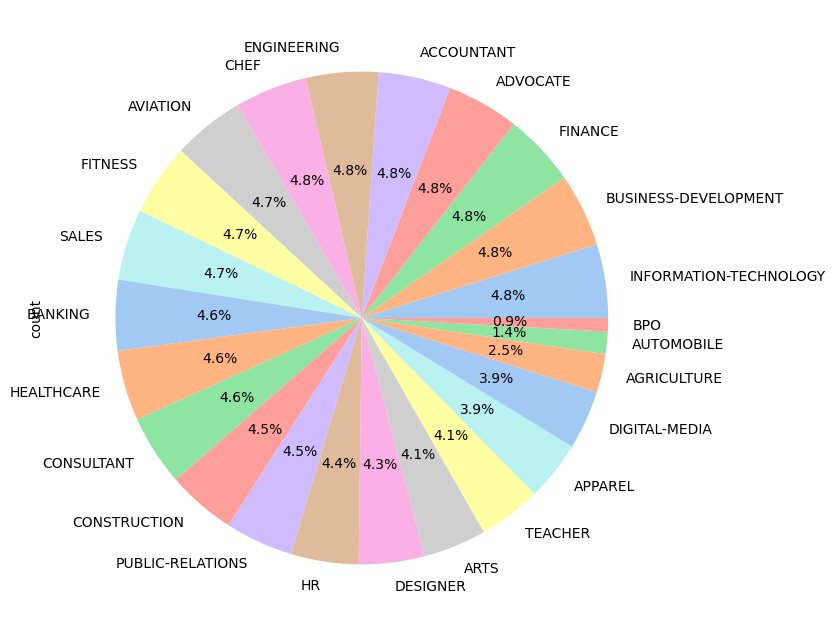

In [18]:
# Define a custom color palette
custom_palette = sns.color_palette("pastel")

# Plot the pie chart with the custom color palette
plt.figure(figsize=(8, 8))
df['Category'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=custom_palette)
plt.xticks(rotation=90)
plt.show()

In [19]:
df['Category'].value_counts()

Category
INFORMATION-TECHNOLOGY    120
BUSINESS-DEVELOPMENT      120
FINANCE                   118
ADVOCATE                  118
ACCOUNTANT                118
ENGINEERING               118
CHEF                      118
AVIATION                  117
FITNESS                   117
SALES                     116
BANKING                   115
HEALTHCARE                115
CONSULTANT                115
CONSTRUCTION              112
PUBLIC-RELATIONS          111
HR                        110
DESIGNER                  107
ARTS                      103
TEACHER                   102
APPAREL                    97
DIGITAL-MEDIA              96
AGRICULTURE                63
AUTOMOBILE                 36
BPO                        22
Name: count, dtype: int64

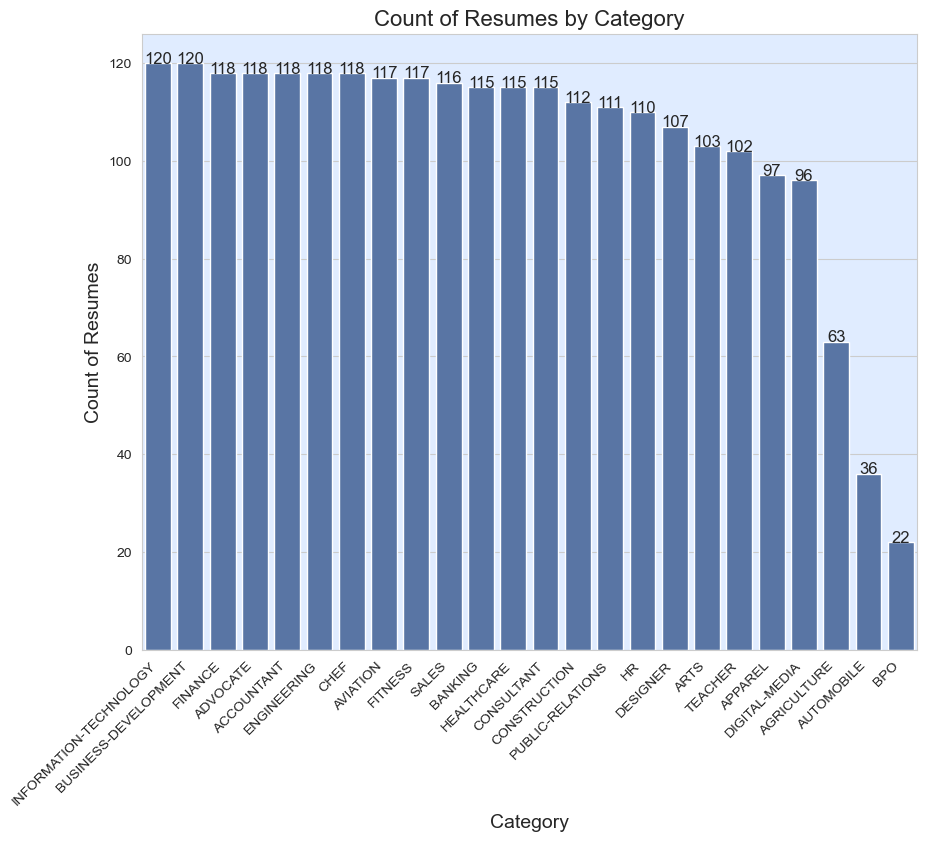

In [20]:

# Set the style and background color
sns.set_style("whitegrid", {"axes.facecolor": "#E0ECFF"})  # Light blue background color

# Create a figure and axis objects
plt.figure(figsize=(10, 8))

# Define a standard blue color for the bars
standard_blue = "#4C72B0"

# Plot a vertical bar chart with the standard blue color
sns.countplot(x="Category", data=df, color=standard_blue, order=df['Category'].value_counts().index)

# Add labels and title
plt.xlabel("Category", fontsize=14)
plt.ylabel("Count of Resumes", fontsize=14)
plt.title("Count of Resumes by Category", fontsize=16)

# Add annotations
for index, value in enumerate(df['Category'].value_counts()):
    plt.text(index, value, str(value), fontsize=12, ha='center')

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

# Show plot
plt.show()


### Word Map for Job categories

In [21]:
def wordcloud(df):
    txt = ' '.join(txt for txt in df['Resume'])
    wordcloud = WordCloud(
        height=2000,
        width=4000,
        colormap=WORDCLOUD_COLOR_MAP
    ).generate(txt)

    return wordcloud

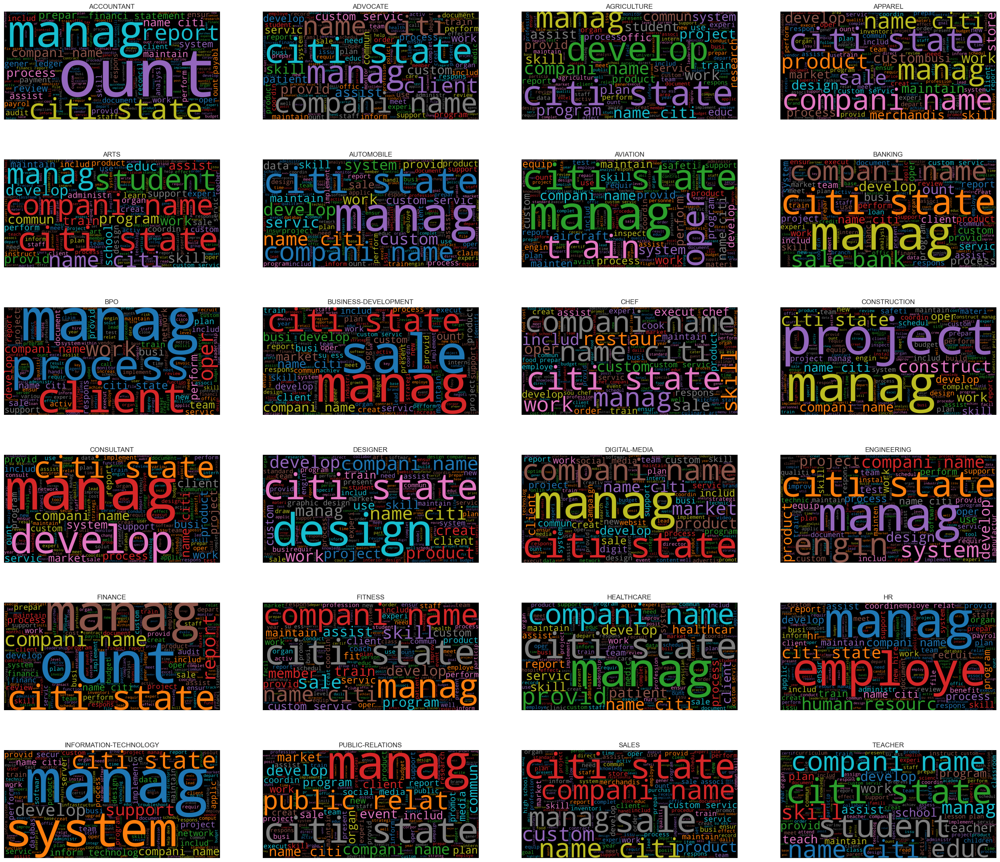

In [22]:
plt.figure(figsize=(32, 28))

for i, category in enumerate(categories):
    wc = wordcloud(df_categories[i])

    plt.subplot(6, 4, i + 1).set_title(category)
    plt.imshow(wc)
    plt.axis('off')
    plt.plot()

plt.show()
plt.close()

 ##### Removing most commonly used words for model building

In [23]:
del_words = ['a','name', 'city', 'state', 'country', 'fullname', 'company', 'resume', 'curriculum vitae', 'address', 'phone',
             'email', 'linkedin', 'profile', 'summary', 'objective', 'experience', 'education', 'skill', 'skills',
             'reference', 'references', 'contact', 'detail', 'details', 'mail', 'gmail', 'yahoo', 'hotmail', 'mailing',
             'linkedin', 'twitter', 'facebook', 'instagram', 'website', 'web', 'url', 'www', 'year']

##### Term Frequency

In [24]:
stop_words = set(stopwords.words('english')+['``',"''"]+del_words)
total_words = []
sentences = df['Resume'].values
cleaned_sentences = ""
for sentence in sentences:
    cleaned_sentences += sentence
    required_words = nltk.word_tokenize(sentence)
    for word in required_words:
        if word not in stop_words and word not in string.punctuation:
            total_words.append(word)

In [25]:
word_freq_fist = nltk.FreqDist(total_words)
most_freq = word_freq_fist.most_common(50)
print(most_freq)

[('manag', 24408), ('compani', 15723), ('citi', 15128), ('develop', 12127), ('custom', 11777), ('servic', 9241), ('work', 8875), ('ount', 8666), ('sale', 8553), ('busi', 8175), ('project', 8073), ('product', 7516), ('train', 7284), ('system', 7266), ('team', 7156), ('process', 6916), ('commun', 6893), ('plan', 6524), ('client', 6516), ('new', 6410), ('market', 6253), ('report', 6206), ('provid', 6169), ('oper', 6152), ('includ', 6129), ('design', 6102), ('assist', 6066), ('maintain', 6005), ('experi', 5853), ('program', 5562), ('perform', 5441), ('support', 5147), ('offic', 5125), ('educ', 5111), ('inform', 4885), ('prepar', 4594), ('use', 4470), ('implement', 4436), ('respons', 4393), ('employe', 4391), ('profession', 4384), ('financi', 4363), ('administr', 4015), ('staff', 3977), ('time', 3968), ('creat', 3967), ('ensur', 3939), ('excel', 3817), ('data', 3797), ('organ', 3766)]


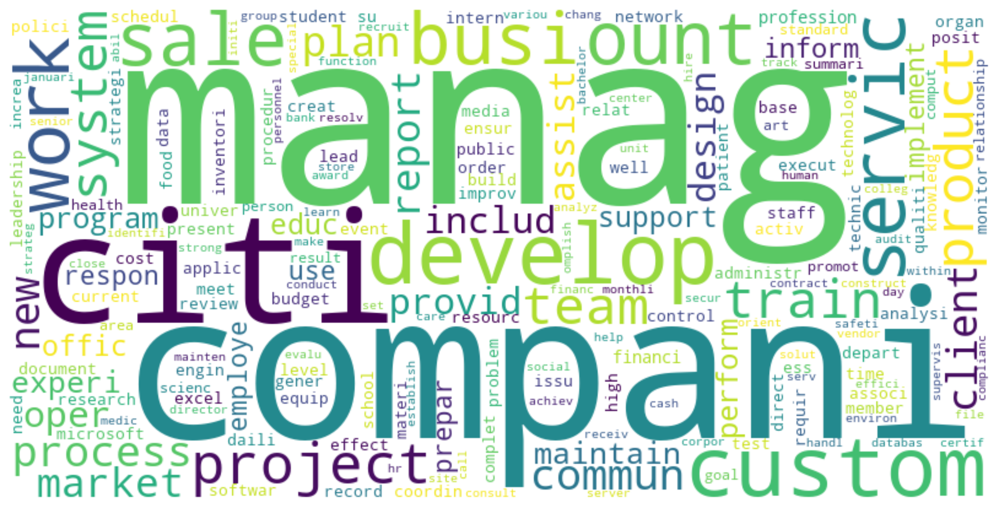

In [26]:
# Generate word cloud excluding unused words
wc = WordCloud(collocations=False, width=800, height=400, background_color='white').generate(' '.join(total_words))

# Plot word cloud
plt.figure(figsize=(12, 6), dpi=300)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()

In [27]:
def wordfreq(df, del_words):
    # Split the resume text, count word frequencies, and reset index
    count = df['Resume'].str.split(expand=True).stack().value_counts().reset_index()
    count.columns = ['Word', 'Frequency']
    
    # Filter out the unused words
    count = count[~count['Word'].isin(del_words)]
    
    return count.head(10)

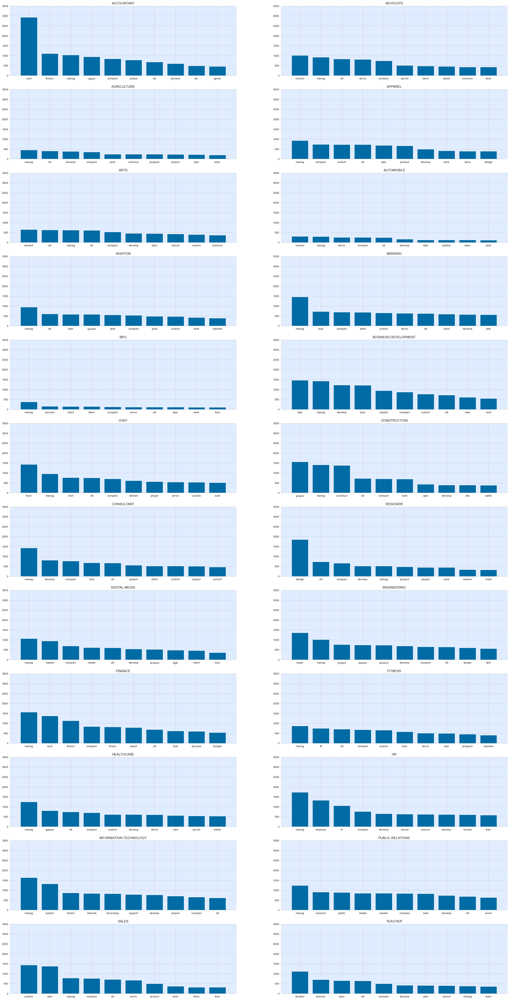

In [28]:
fig = plt.figure(figsize=(32, 64))

for i, category in enumerate(categories):
    wf = wordfreq(df_categories[i], del_words)

    fig.add_subplot(12, 2, i + 1).set_title(category)
    plt.bar(wf['Word'], wf['Frequency'])
    plt.ylim(0, 3500)

plt.show()
plt.close()

### Model Building 

In [29]:
# Function to extract text from PDF
def extract_text_from_pdf(pdf_path):
    with open(pdf_path, 'rb') as file:
        reader = PdfReader(file)
        resume_text = ''
        for page in reader.pages:
            resume_text += page.extract_text()
    return resume_text

In [30]:
from sklearn.feature_extraction.text import CountVectorizer

# Receive job description input
job_description = input("Enter the job description: ")

# Receive resume upload
resume_path = input("Upload your resume (PDF): ")

# Extract text from the uploaded PDF resume
uploaded_resume_text = extract_text_from_pdf(resume_path)

# Preprocess job description and uploaded resume text
job_description = preprocess(job_description)
uploaded_resume_text = preprocess(uploaded_resume_text)

# Tokenize and vectorize the job description text using CountVectorizer
vectorizer = CountVectorizer(stop_words='english')
job_description_vector = vectorizer.fit_transform([job_description])

# Use the vocabulary learned from the job description vectorizer for the resume vectorizer
resume_vectorizer = CountVectorizer(stop_words='english')
resume_vector = resume_vectorizer.fit_transform([uploaded_resume_text])

# Get feature names from CountVectorizer
job_description_keywords = vectorizer.get_feature_names_out()
resume_keywords = resume_vectorizer.get_feature_names_out()

# Convert feature names to sets for faster intersection operation
job_description_keywords_set = set(job_description_keywords)
resume_keywords_set = set(resume_keywords)

# Check presence of main keywords in both job description and uploaded resume
matching_keywords = job_description_keywords_set.intersection(resume_keywords_set)
matching_score = len(matching_keywords) / len(resume_keywords_set)

# Display matching score
print("Matching Score:", matching_score)
# Assuming you have calculated the matching_score

if matching_score <= 0.30:
    # Display sad emoji and message
    print("\U0001F625")
    print("You don't fit job requirements kindly update resume.")
elif matching_score < 0.70: 
    
    print("\U0001F642")
    print("You are  fit for this job.")
elif matching_score > 0.90:
    # Display a different message or take other actions
    print("\U0001F600")
    print("You are a potential candidate for this job.")


Enter the job description: We are looking for a Data Analyst who is skilled in data manipulation and analysis using Python and R, with a strong background in business analysis. The successful candidate will be involved in optimizing business processes and implementing data-driven strategies.
Upload your resume (PDF): Jagadeesh Sunkara Resume- DA.pdf
Matching Score: 0.06796116504854369
😥
You don't fit job requirements kindly update resume.


##### Entity Recognition

In [34]:
import pandas as pd
from PyPDF2 import PdfReader
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import string
import nltk
from autocorrect import Speller

# nltk.download('punkt')
# nltk.download('stopwords')

# Function to preprocess text and correct misspelled words
def preprocess(text):
    # Tokenize text
    tokens = nltk.word_tokenize(text.lower())
    # Remove punctuation and stop words, and perform stemming
    stop_words = set(stopwords.words('english'))
    punctuation = set(string.punctuation)
    spell = Speller(lang='en')
    stemmer = PorterStemmer()
    processed_tokens = [stemmer.stem(spell(token)) for token in tokens if token.isalnum() and spell(token) not in stop_words and token not in punctuation]
    return ' '.join(processed_tokens)



# Receive job description input
job_description = input("Enter the job description: ")

# Receive resume upload
resume_path = input("Upload your resume (PDF): ")

# Extract text from the uploaded PDF resume
uploaded_resume_text = extract_text_from_pdf(resume_path)

# Preprocess job description and uploaded resume text
job_description = preprocess(job_description)
uploaded_resume_text = preprocess(uploaded_resume_text)

# Tokenize preprocessed text
job_description_tokens = nltk.word_tokenize(job_description)
uploaded_resume_tokens = nltk.word_tokenize(uploaded_resume_text)

# Find common words between job description and resume
common_words = set(job_description_tokens) & set(uploaded_resume_tokens)

# Highlight matching words in the resume text
highlighted_resume_text = uploaded_resume_text
for word in common_words:
    highlighted_resume_text = highlighted_resume_text.replace(word, f"\033[1;31;47m{word}\033[m")

# Display the highlighted resume text
print("Highlighted Resume Text:")
print(highlighted_resume_text)

Enter the job description: Enter the job description: We are looking for a Data Analyst who is skilled in data manipulation and analysis using Python, with a strong background in business analysis. The successful candidate will be involved in optimizing business processes and implementing data-driven strategies.
Upload your resume (PDF): Jagadeesh Sunkara Resume- DA.pdf
Highlighted Resume Text:
jagadeesh sunkara baltimor oc09972 educ univers maryland baltimor counti baltimor md master profession studi data scienc ga may 2024 love profession univers punjab india bachelor technolog tech comput scienc ga may 2020 technic skill program languag python num panda matplotlib learn r sql c data scienc data clean eda data visual model build optim tableau excel develop tool jupit notebook git visual studio postal api ira skill acquir analyt busi analysi user stori requir gather storytel critic think work experi desa busi data analyst bengaluru india june 2020 januari 2023 led softwar implement bo

# Spacy

In [35]:
import spacy

# Check if spaCy model is available
try:
    # Attempt to load the spaCy model
    nlp = spacy.load("en_core_web_lg")
    print("spaCy model 'en_core_web_lg' is already available.")
except OSError:
    # If spaCy model is not available, download it
    print("Downloading spaCy model 'en_core_web_lg'...")
    subprocess.call(["python", "-m", "spacy", "download", "en_core_web_lg"])
    print("spaCy model 'en_core_web_lg' downloaded successfully.")

    # Load the downloaded model
    nlp = spacy.load("en_core_web_lg")

# Now, you can proceed with your code
skill_pattern_path = "jz_skill_patterns.jsonl"

spaCy model 'en_core_web_lg' is already available.


In [36]:
ruler = nlp.add_pipe("entity_ruler")
ruler.from_disk(skill_pattern_path)
nlp.pipe_names

['tok2vec',
 'tagger',
 'parser',
 'attribute_ruler',
 'lemmatizer',
 'ner',
 'entity_ruler']

In [37]:
def get_skills(text):
    # Process the text with spaCy
    doc = nlp(text)
    
    # Initialize a list to store skills
    skills = []
    
    # Loop through named entities in the document
    for ent in doc.ents:
        # Check if the entity is labeled as a skill
        if ent.label_ == "SKILL":
            # Add the skill text to the list
            skills.append(ent.text)
    
    # Return the list of skills
    return skills


def unique_skills(skills):
    unique_skills = list(set(skills))
    return unique_skills

In [38]:
df["skills"] = df["Resume"].str.lower().apply(get_skills)
df["skills"] = df["skills"].apply(unique_skills)

In [40]:
df

,Category,Resume,skills
0,HR,hr administr market associ hr administr summar...,"[segment, front end, design, support, swift, s..."
1,HR,hr specialist us hr oper summari versatil medi...,"[graphic design, design, support]"
2,HR,hr director summari year experi recruit plu ye...,"[design, support, box]"
3,HR,hr specialist summari dedic driven dynam year ...,[]
4,HR,hr manag skill highlight hr skill hr depart st...,"[data center, play, support, box]"
...,...,...,...
2479,AVIATION,rank sgt e non commiss offic charg brigad mail...,[support]
2480,AVIATION,govern relat commun organiz develop director p...,"[design, support]"
2481,AVIATION,geek squad agent profession profil support spe...,"[support, android]"
2482,AVIATION,program director offic manag summari highli pe...,"[play, design, support, twitter]"


##### Entity Recognition


In [41]:
sent = nlp(df["Resume"].iloc[0])
displacy.render(sent, style="ent", jupyter=True)

##### Topic Modeling - LDA

In [42]:
docs = df["Resume"].values
dictionary = corpora.Dictionary(d.split() for d in docs)
bow = [dictionary.doc2bow(d.split()) for d in docs]
lda = gensim.models.ldamodel.LdaModel
num_topics = 4
ldamodel = lda(
    bow, 
    num_topics=num_topics, 
    id2word=dictionary, 
    passes=50, 
    minimum_probability=0
)
ldamodel.print_topics(num_topics=num_topics)

[(0,
  '0.013*"state" + 0.012*"commun" + 0.012*"develop" + 0.012*"manag" + 0.012*"market" + 0.011*"citi" + 0.011*"compani" + 0.010*"student" + 0.009*"media" + 0.008*"public"'),
 (1,
  '0.012*"project" + 0.011*"system" + 0.010*"manag" + 0.010*"engin" + 0.009*"state" + 0.009*"citi" + 0.008*"oper" + 0.008*"work" + 0.008*"construct" + 0.007*"compani"'),
 (2,
  '0.020*"custom" + 0.013*"servic" + 0.013*"state" + 0.011*"manag" + 0.011*"citi" + 0.011*"compani" + 0.009*"a" + 0.009*"skill" + 0.009*"name" + 0.008*"maintain"'),
 (3,
  '0.028*"manag" + 0.018*"a" + 0.014*"ount" + 0.013*"busi" + 0.012*"develop" + 0.011*"compani" + 0.009*"state" + 0.009*"financi" + 0.009*"sale" + 0.008*"project"')]